# 2. Convolution

Give three test images with RAW format, 
please adopt the following filters to check the visualized results

In [97]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.image as mpimg

 Load image from drive and shows the original image

In [98]:
imgDataF16 = np.fromfile('data/F16.raw', dtype='uint8')
imgDatalena = np.fromfile('data/lena.raw', dtype='uint8')
imgDataBaboon = np.fromfile('data/Baboon.raw', dtype='uint8')

In [99]:
def raw_read(imgData):
    nr = 512
    nc = 512
    nchan = 1
    c = 0 #用 c來記錄 raw檔讀取到的 index位置
    img = np.zeros((nr, nc, nchan))
    for i in range(nr):
        for j in range(nc):
            for k in range(0, nchan):
                img[i, j, k] = imgData[c]
                c=c+1
    return img

In [100]:
img_F16 = raw_read(imgDataF16)
img_lena= raw_read(imgDatalena)
img_Baboon= raw_read(imgDataBaboon)

In [101]:
img_F16.shape

(512, 512, 1)

## convolution

In [6]:
# applies convolution to an 2d/3d matrix or numpy array on the given filter
def conv(image, filter):
    iw,ih,id = image.shape
    
    fw,fh = filter.shape    
    out = np.zeros((iw-fw+1,ih-fh+1,id))
    
    for d in range(id):
        for w in range(ih-fh+1):
            for h in range(iw-fw+1):
                out[w,h,d] = np.sum(filter*image[w:w+fh , h:h+fw , d])
    
    if id == 1:
        return np.resize(out, (out.shape[0], out.shape[1])).astype(np.uint8)
    else:
        return out.astype(np.uint8)

## show image

In [14]:
def imshow(img):
    if len(img.shape) < 3:
        plt.imshow(img, cmap="gray")
    elif img.shape[2] == 1:
        plt.imshow(np.resize(img,(img.shape[0],img.shape[1])), cmap="gray")
    else:
        plt.imshow(img)

# 2.i. Gaussian Filter with kernel sizes 3,5,7,33

In [15]:
'''
*Parameters:
- x, y and sigma(double): gaussian function parameters

*Return: 
- Scaler value at x,y for sigma of gaussian function
'''
# gaussian filter
def gfunc(x,y,sigma):
    return (math.exp(-(x**2 + y**2)/(2*(sigma**2))))/(2*3.14*(sigma**2))

def gaussFilter(size, sigma):
    out = np.zeros(size)
    for i in range(size[0]):
        for j in range(size[1]):
            out[i,j] = gfunc(i-size[0]//2,j-size[1]//2, sigma)
    return out/np.sum(out)

F16

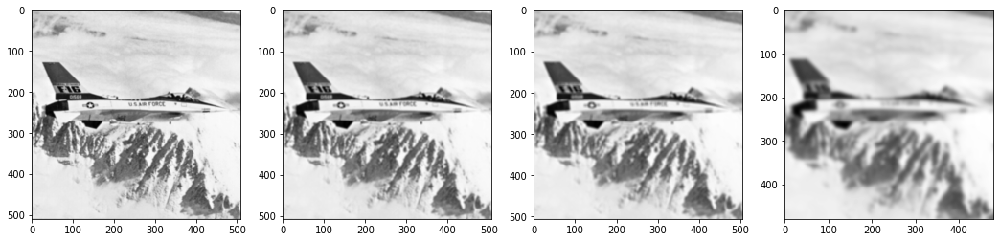

In [16]:
img_F16_3 = conv(img_F16.copy(), gaussFilter((3,3),4))
img_F16_5 = conv(img_F16.copy(), gaussFilter((5,5),4))
img_F16_7 = conv(img_F16.copy(), gaussFilter((7,7),4))
img_F16_33 = conv(img_F16.copy(), gaussFilter((33,33),4))

images = [img_F16_3, img_F16_5, img_F16_7, img_F16_33]
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (18, 18))
for ind, p in enumerate(images):
    ax = axs[ind]
    ax.imshow(p, cmap='gray')
plt.show()

lena

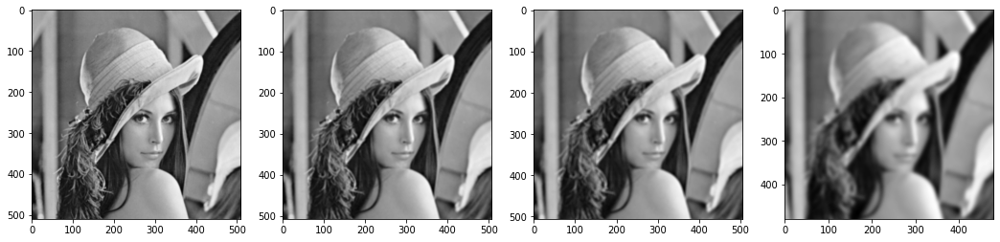

In [20]:
img_lena_3 = conv(img_lena.copy(), gaussFilter((3,3),4))
img_lena_5 = conv(img_lena.copy(), gaussFilter((5,5),4))
img_lena_7 = conv(img_lena.copy(), gaussFilter((7,7),4))
img_lena_33 = conv(img_lena.copy(), gaussFilter((33,33),4))

images = [img_lena_3, img_lena_5, img_lena_7, img_lena_33]
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (18, 18))
for ind, p in enumerate(images):
    ax = axs[ind]
    ax.imshow(p, cmap='gray')
plt.show()

Baboon

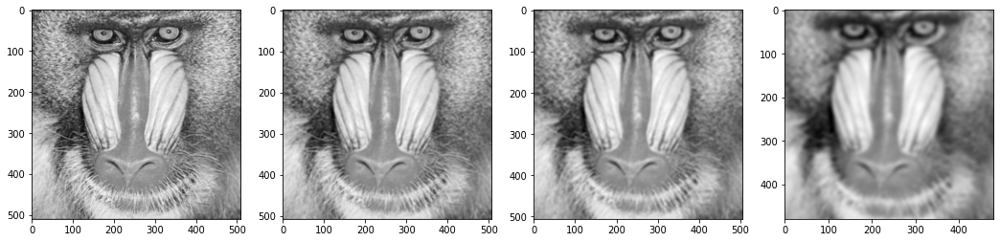

In [21]:
img_Baboon_3 = conv(img_Baboon.copy(), gaussFilter((3,3),4))
img_Baboon_5 = conv(img_Baboon.copy(), gaussFilter((5,5),4))
img_Baboon_7 = conv(img_Baboon.copy(), gaussFilter((7,7),4))
img_Baboon_33 = conv(img_Baboon.copy(), gaussFilter((33,33),4))

images = [img_Baboon_3, img_Baboon_5, img_Baboon_7, img_Baboon_33]
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (18, 18))
for ind, p in enumerate(images):
    ax = axs[ind]
    ax.imshow(p, cmap='gray')
plt.show()

# 2.ii. Averaging Filter with kernel sizes 3, 5,7, 33

In [18]:
def Averaging(img, ksize):
    # Develop Averaging filter(n, n) mask
    mask = np.ones([ksize, ksize], dtype = int)
    mask = mask / (ksize**2)
    #補 0要調整的 pixel大小
    adj = ksize//2 
    # 補0後的長寬長度
    newlen = 512 + adj*2
    # 初始化Convolve後的 img
    img_new = np.zeros([newlen, newlen])
    # 補0後的img初始化
    large_img = np.zeros([newlen, newlen])
    
    #將原本img補 0
    for i in range(adj, newlen-adj):
        for j in range(adj, newlen-adj):
            large_img[i,j] = img[i-adj, j-adj]
    
    # Convolve the mask over the image
    for i in range(newlen):
        for j in range(newlen):
            # kernel conv
            if i<newlen-2*adj and j<newlen-2*adj:
                temp = 0
                for k in range(ksize):
                    for l in range(ksize):
                            temp += large_img[i+k, j+l]*mask[k, l]
                img_new[i+adj, j+adj]= temp
                
    img_new = img_new.astype(np.uint8)
    #將外邊的補0的部分切割掉
    return img_new[adj:adj+512, adj:adj+512]

F16

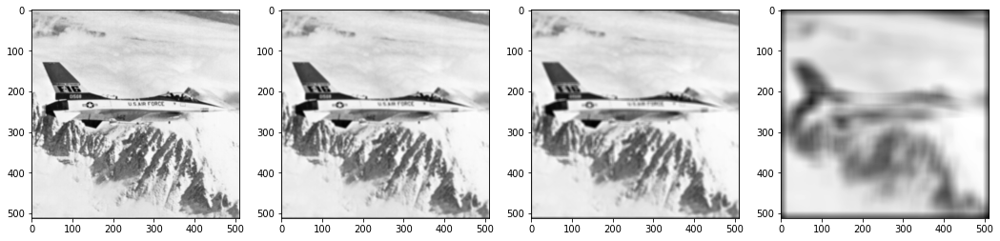

In [22]:
img_F16_aver_3 = Averaging(img_F16.copy(), 3)
img_F16_aver_5 = Averaging(img_F16.copy(), 5)
img_F16_aver_7 = Averaging(img_F16.copy(), 7)
img_F16_aver_33 = Averaging(img_F16.copy(), 33)

images = [img_F16_aver_3, img_F16_aver_5, img_F16_aver_7, img_F16_aver_33]
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (18, 18))
for ind, p in enumerate(images):
    ax = axs[ind]
    ax.imshow(p, cmap='gray')
plt.show()

lena

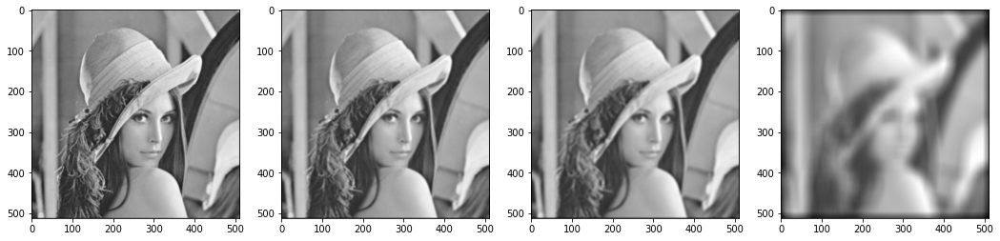

In [23]:
img_lena_aver_3 = Averaging(img_lena.copy(), 3)
img_lena_aver_5 = Averaging(img_lena.copy(), 5)
img_lena_aver_7 = Averaging(img_lena.copy(), 7)
img_lena_aver_33 = Averaging(img_lena.copy(), 33)

images = [img_lena_aver_3, img_lena_aver_5, img_lena_aver_7, img_lena_aver_33]
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (18, 18))
for ind, p in enumerate(images):
    ax = axs[ind]
    ax.imshow(p, cmap='gray')
plt.show()

Baboon

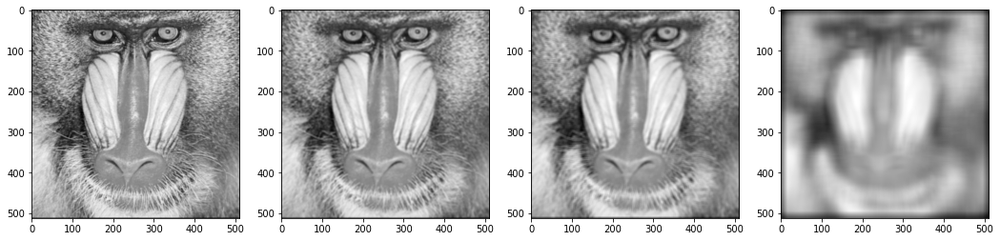

In [24]:
img_Baboon_aver_3 = Averaging(img_Baboon.copy(), 3)
img_Baboon_aver_5 = Averaging(img_Baboon.copy(), 5)
img_Baboon_aver_7 = Averaging(img_Baboon.copy(), 7)
img_Baboon_aver_33 = Averaging(img_Baboon.copy(), 33)

images = [img_Baboon_aver_3, img_Baboon_aver_5, img_Baboon_aver_7, img_Baboon_aver_33]
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (18, 18))
for ind, p in enumerate(images):
    ax = axs[ind]
    ax.imshow(p, cmap='gray')
plt.show()

# 2.iii. Unsharp mask filter with Kernel sizes 3,5,7

In [59]:
def Convolve(image, kernel):
    hi, wi= image.shape
    hk, wk = kernel.shape
    image_padded = np.zeros(shape=(hi + hk - 1, wi + wk - 1))    
    image_padded[hk//2:-hk//2+1, wk//2:-wk//2+1] = image
    out = np.zeros(shape=image.shape)
    for row in range(hi):
        for col in range(wi):
            for i in range(hk):
                for j in range(wk):
                    out[row, col] += image_padded[row + i, col + j]*kernel[i, j]
    return out

In [72]:
def unsharpFilter(image, gaussimage, amount):
    """Single channel implementation of the unsharp masking filter."""   
    blurred = gaussimage
    result = image + (image - blurred) * amount
    return result

F16

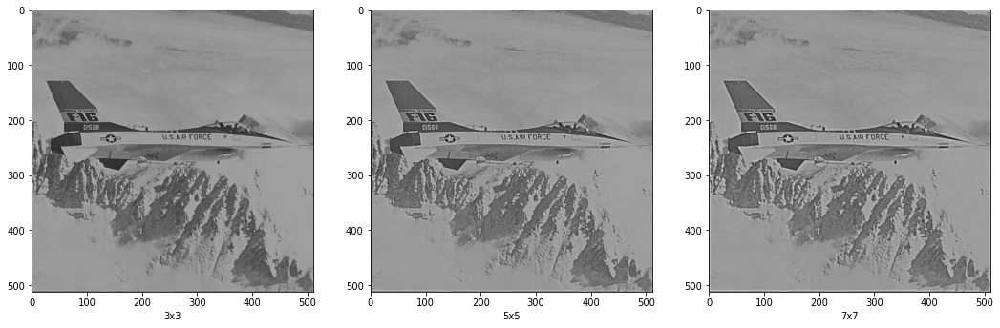

In [91]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    unsharp_image = unsharpFilter(img_F16.copy(), Convolve(img_F16.copy(), gaussFilter((i,i),4)), 2)
    imshow(unsharp_image)
plt.show()

lena

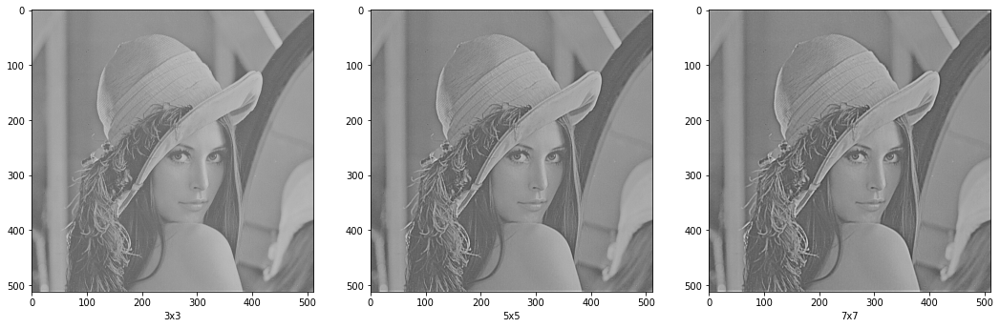

In [89]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    unsharp_image = unsharpFilter(img_lena.copy().reshape(512, 512), Convolve(img_lena.copy().reshape(512, 512), gaussFilter((i,i),4)), 2)
    imshow(unsharp_image)
plt.show()

Baboon

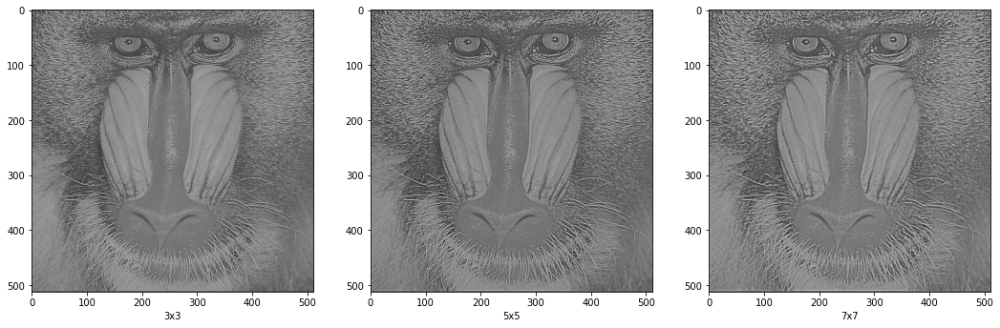

In [92]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    unsharp_image = unsharpFilter(img_Baboon.copy().reshape(512, 512), Convolve(img_Baboon.copy().reshape(512, 512), gaussFilter((i,i),4)), 2)
    imshow(unsharp_image)
plt.show()

# 2.iv. Laplacian Filter with Kernel sizes 3,5,7

In [45]:
#define function
def log_func(x, y, sigma):
    #分子部分
    nom = (y**2)+(x**2)-2*(sigma**2) 
    den = 2*math.pi*(sigma**6)
    expo = math.exp(-((x**2)+(y**2))/(2*(sigma**2)))
    return nom*expo/den

In [46]:
#Creating the filter image
def log_filter(sigma, size):
    w = math.ceil(float(size)*float(sigma))
    #若為偶數則將之改為奇數
    if(w%2 == 0):
        w = w + 1

    log_mask = []

    w_range = int(math.floor(size/2))
    for i in range(-w_range, w_range+1):
        for j in range(-w_range, w_range+1):
            log_mask.append(log_func(i,j,sigma))
    log_mask = np.array(log_mask)
    log_mask = log_mask.reshape(size,size)
    return log_mask

F16

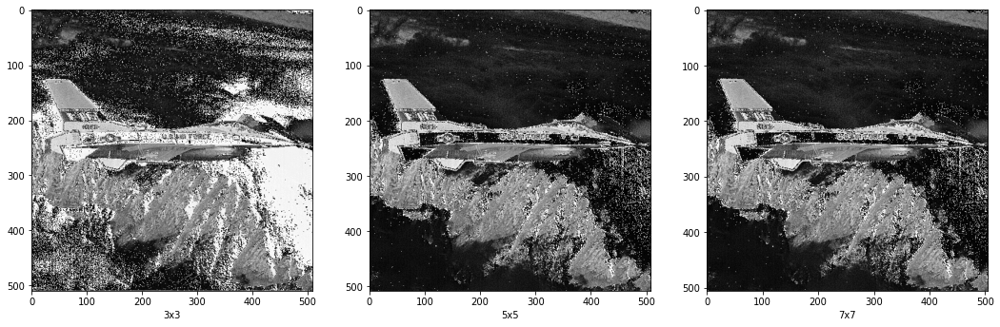

In [123]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    lap_image = conv(img_F16.copy(), log_filter(0.5, i))
    imshow(lap_image)
plt.show()

lena

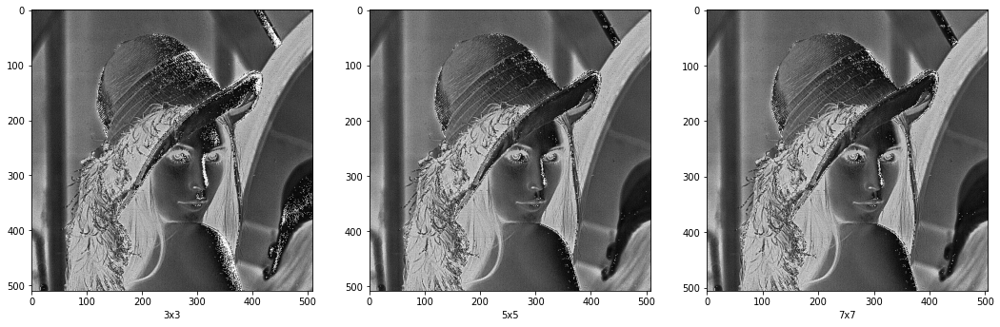

In [115]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    lap_image = conv(img_lena.copy(), log_filter(0.5, i))
    imshow(lap_image)
plt.show()

Baboon

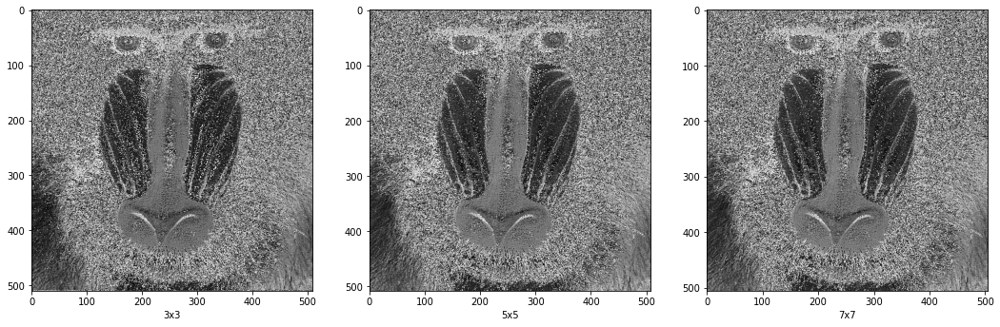

In [111]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    lap_image = conv(img_Baboon.copy(), log_filter(0.5, i))
    imshow(lap_image)
plt.show()

# 2.v. Sobel Filter with kernel sizes 3,5,7

In [93]:
#create n*n sobel filter
def Sobel(ksize, axis):
    """
    shape must be odd: eg. (5,5)
    axis is the direction, with 0 to positive x and 1 to positive y
    """
    k = np.zeros([ksize,ksize])
    p = [(j,i) for j in range(ksize) 
           for i in range(ksize) 
           if not (i == (ksize -1)/2. and j == (ksize -1)/2.)]

    for j, i in p:
        j_ = int(j - (ksize -1)/2.)
        i_ = int(i - (ksize -1)/2.)
        k[j,i] = (i_ if axis==0 else j_)/float(i_*i_ + j_*j_)
    return k

F16 (positive x)

In [96]:
img_F16.shape

(512, 512)

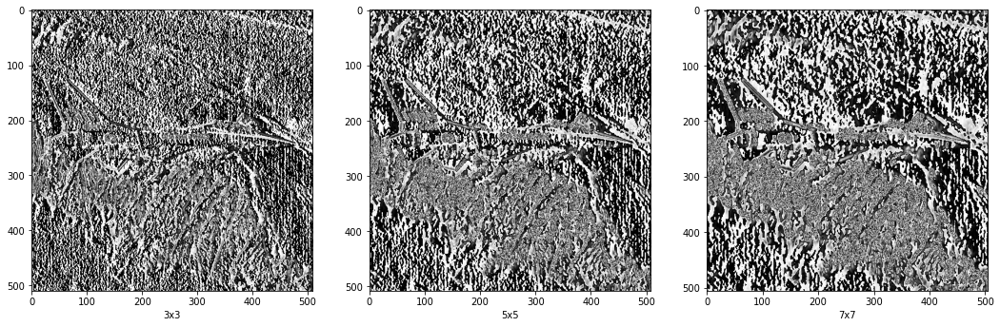

In [102]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    sobel_image = conv(img_F16.copy(), Sobel(i, 0))
    imshow(sobel_image)
plt.show()

F16 (positive Y)

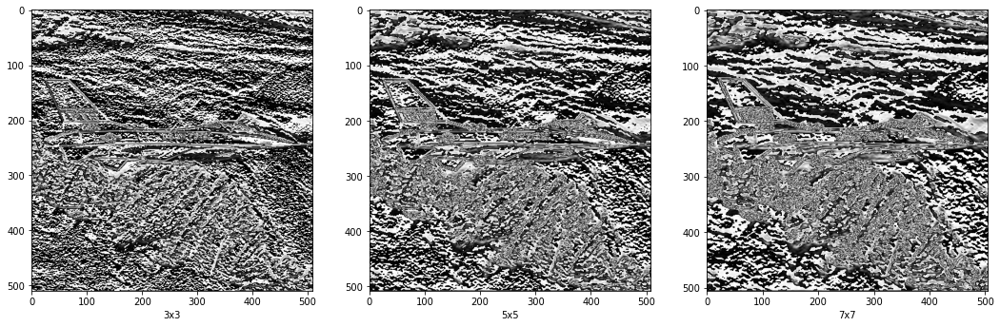

In [28]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    sobel_image = conv(img_F16.copy(), Sobel(i, 1))
    imshow(sobel_image)
plt.show()

lena (positive x)

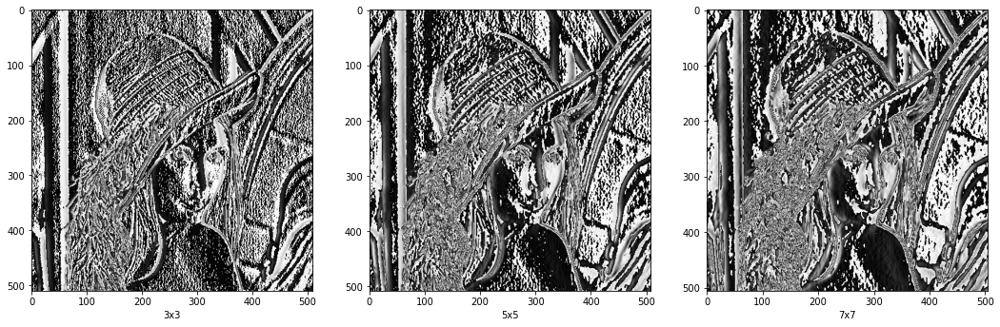

In [95]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    sobel_image = conv(img_lena.copy(), Sobel(i, 0))
    imshow(sobel_image)
plt.show()

lena (positive y)

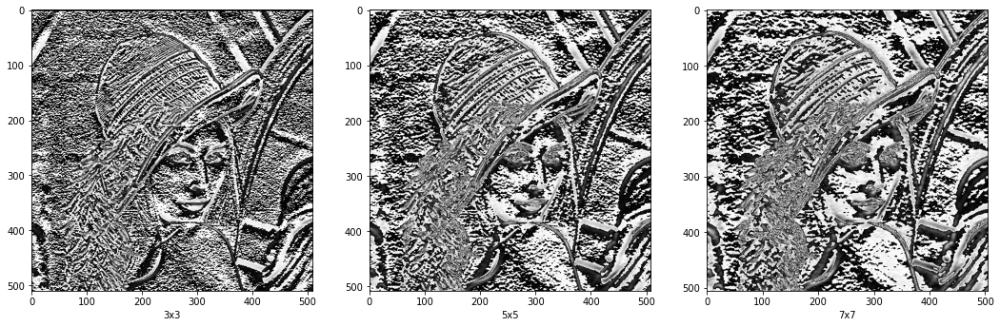

In [31]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    sobel_image = conv(img_lena.copy(), Sobel(i, 1))
    imshow(sobel_image)
plt.show()

Baboon (positive x)

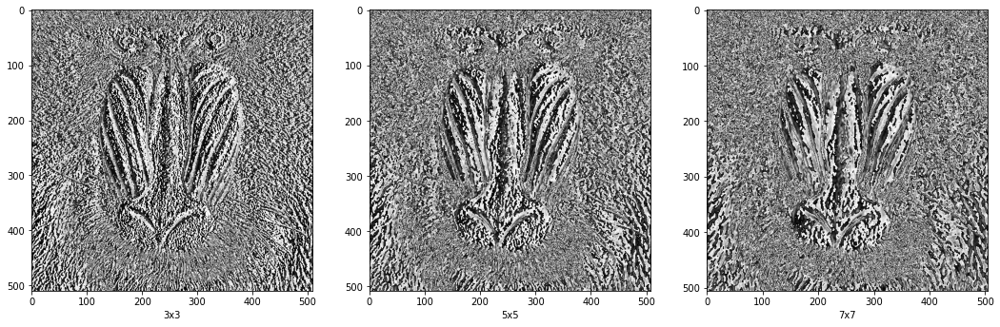

In [32]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    sobel_image = conv(img_Baboon.copy(), Sobel(i, 0))
    imshow(sobel_image)
plt.show()

Baboon (positive y)

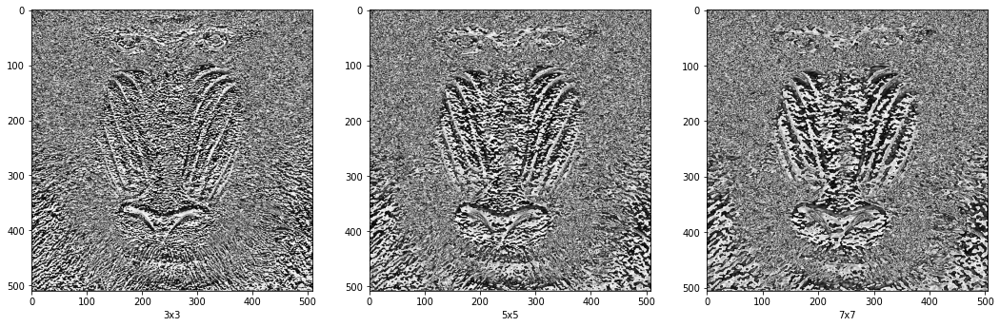

In [33]:
fig = plt.figure(1, figsize=(18, 16))
for i in range(3,8,2):
    splot = plt.subplot(130-1+((i+1)//2))
    splot.set_xlabel(str(i)+"x"+str(i))
    sobel_image = conv(img_Baboon.copy(), Sobel(i, 1))
    imshow(sobel_image)
plt.show()